# Exploring Datasets with Python

In this short demo we will analyse a given dataset from 1978, which contains information about politicians having affairs. 

To analyse it, we will use a [Jupyter Notebook](http://jupyter.org/), which is basically a *REPL++* for Python. Entering a command with shift executes the line and prints the result.

To work with common files like CSV, JSON, Excel files etc., we will use [Pandas](http://pandas.pydata.org/), _an open source, BSD-licensed library providing high-performance, easy-to-use data structures and data analysis tools for the Python programming language_™. Let's import it!

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

Our dataset is given as a CSV file. Pandas provides an easy way to read our file with `read_csv`. The path of the file to read is relative to our notebook file. The path can also be an URL, supporting HTTP, FTP and also S3 if your data is stored inside an AWS S3 Bucket!

In [2]:
dataset = pd.read_csv("cancer.csv")

The first thing we will check is the size of our dataset. We can use `info()` to get the number of entries of each column.

In [3]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Id                         569 non-null    int64  
 1   Diagnosis                  569 non-null    object 
 2   Radius (mean)              569 non-null    float64
 3   Texture (mean)             569 non-null    float64
 4   Perimeter (mean)           569 non-null    float64
 5   Area (mean)                569 non-null    float64
 6   Smoothness (mean)          569 non-null    float64
 7   Compactness (mean)         569 non-null    float64
 8   Concavity (mean)           569 non-null    float64
 9   Concave points (mean)      569 non-null    float64
 10  Symmetry (mean)            569 non-null    float64
 11  Fractal dimension (mean)   569 non-null    float64
 12  Radius (se)                569 non-null    float64
 13  Texture (se)               569 non-null    float64

Now we know how many data is inside our file. Pandas is smart enough to parse the column titles by itself and estimate the data types of each column.

You may be curious how the data looks like. Let's see by using `head()`, which will print the first 5 rows.

In [4]:
dataset.head()

,Id,Diagnosis,Radius (mean),Texture (mean),Perimeter (mean),Area (mean),Smoothness (mean),Compactness (mean),Concavity (mean),Concave points (mean),...,Radius (worst),Texture (worst),Perimeter (worst),Area (worst),Smoothness (worst),Compactness (worst),Concavity (worst),Concave points (worst),Symmetry (worst),Fractal dimension (worst)
0,8510426,B,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.047810,...,15.110,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259
1,8510653,B,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.031100,...,14.500,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183
2,8510824,B,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.020760,...,10.230,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773
3,854941,B,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.029230,...,13.300,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169
4,85713702,B,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,...,8.964,21.96,57.26,242.2,0.12970,0.13570,0.06880,0.02564,0.3105,0.07409


We can access a column of our dataset by using bracket notation and the name of the column.

In [5]:
dataset['Symmetry (worst)']

0      0.2977
1      0.3184
2      0.2450
3      0.1987
4      0.3105
        ...  
564    0.2929
565    0.2060
566    0.2572
567    0.2218
568    0.4087
Name: Symmetry (worst), Length: 569, dtype: float64

For categorical features like `sex`, you can also get the distributions of each value by using `value_counts()`.

In [6]:
dataset["Diagnosis"].value_counts()

B    357
M    212
Name: Diagnosis, dtype: int64

But what about numerical values? It definitly makes no sense to count each distinct value. Therefore, we can use `describe()`.

In [7]:
dataset.describe()

,Id,Radius (mean),Texture (mean),Perimeter (mean),Area (mean),Smoothness (mean),Compactness (mean),Concavity (mean),Concave points (mean),Symmetry (mean),...,Radius (worst),Texture (worst),Perimeter (worst),Area (worst),Smoothness (worst),Compactness (worst),Concavity (worst),Concave points (worst),Symmetry (worst),Fractal dimension (worst)
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [8]:
dataset.columns

Index(['Id', 'Diagnosis', 'Radius (mean)', 'Texture (mean)',
       'Perimeter (mean)', 'Area (mean)', 'Smoothness (mean)',
       'Compactness (mean)', 'Concavity (mean)', 'Concave points (mean)',
       'Symmetry (mean)', 'Fractal dimension (mean)', 'Radius (se)',
       'Texture (se)', 'Perimeter (se)', 'Area (se)', 'Smoothness (se)',
       'Compactness (se)', 'Concavity (se)', 'Concave points (se)',
       'Symmetry (se)', 'Fractal dimension (se)', 'Radius (worst)',
       'Texture (worst)', 'Perimeter (worst)', 'Area (worst)',
       'Smoothness (worst)', 'Compactness (worst)', 'Concavity (worst)',
       'Concave points (worst)', 'Symmetry (worst)',
       'Fractal dimension (worst)'],
      dtype='object')

You can also access values like `mean` or `max` directly with the corrsponding methods. Let's see who is the oldest cheater!

In [9]:
dataset["Area (mean)"].max()

2501.0

This works for the whole dataframe as well. Pandas knows which values are numerical based on the datatype and hides the categorical features for you.

In [10]:
dataset.max()

Id                           911320502
Diagnosis                            M
Radius (mean)                    28.11
Texture (mean)                   39.28
Perimeter (mean)                 188.5
Area (mean)                     2501.0
Smoothness (mean)               0.1634
Compactness (mean)              0.3454
Concavity (mean)                0.4268
Concave points (mean)           0.2012
Symmetry (mean)                  0.304
Fractal dimension (mean)       0.09744
Radius (se)                      2.873
Texture (se)                     4.885
Perimeter (se)                   21.98
Area (se)                        542.2
Smoothness (se)                0.03113
Compactness (se)                0.1354
Concavity (se)                   0.396
Concave points (se)            0.05279
Symmetry (se)                  0.07895
Fractal dimension (se)         0.02984
Radius (worst)                   36.04
Texture (worst)                  49.54
Perimeter (worst)                251.2
Area (worst)             

There is also an easy way to filter your dataset. Let's say we want to have a subset of our data containing only woman. This is also possible with the bracket notation!

In [11]:
malignant_dataset = dataset[dataset["Diagnosis"]=="M"]
malignant_dataset

,Id,Diagnosis,Radius (mean),Texture (mean),Perimeter (mean),Area (mean),Smoothness (mean),Compactness (mean),Concavity (mean),Concave points (mean),...,Radius (worst),Texture (worst),Perimeter (worst),Area (worst),Smoothness (worst),Compactness (worst),Concavity (worst),Concave points (worst),Symmetry (worst),Fractal dimension (worst)
357,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
358,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
359,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
360,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
361,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926125,M,20.92,25.09,143.00,1347.0,0.10990,0.22360,0.31740,0.14740,...,24.29,29.41,179.10,1819.0,0.1407,0.4186,0.6599,0.2542,0.2929,0.09873
565,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.45,26.40,166.10,2027.0,0.1410,0.2113,0.4107,0.2216,0.2060,0.07115
566,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.69,38.25,155.00,1731.0,0.1166,0.1922,0.3215,0.1628,0.2572,0.06637
567,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.98,34.12,126.70,1124.0,0.1139,0.3094,0.3403,0.1418,0.2218,0.07820


The above statement returns a new dataframe (not a copy, modifying this data will modify the original as well), which can be accessed like before. Let's see how the numerical distribution is for our females.

In [12]:
malignant_dataset.max()

Id                           911296202
Diagnosis                            M
Radius (mean)                    28.11
Texture (mean)                   39.28
Perimeter (mean)                 188.5
Area (mean)                     2501.0
Smoothness (mean)               0.1447
Compactness (mean)              0.3454
Concavity (mean)                0.4268
Concave points (mean)           0.2012
Symmetry (mean)                  0.304
Fractal dimension (mean)       0.09744
Radius (se)                      2.873
Texture (se)                     3.568
Perimeter (se)                   21.98
Area (se)                        542.2
Smoothness (se)                0.03113
Compactness (se)                0.1354
Concavity (se)                  0.1438
Concave points (se)             0.0409
Symmetry (se)                  0.07895
Fractal dimension (se)         0.01284
Radius (worst)                   36.04
Texture (worst)                  49.54
Perimeter (worst)                251.2
Area (worst)             

This should be enought about Pandas. Let's get some visualisations!

## Visualize Data

To visualize our data, we will use [Seaborn](https://seaborn.pydata.org), a Python visualization library based on matplotlib. It provides a high-level interface for drawing attractive statistical graphics. Let's import it.

In [13]:
import seaborn as sns

To see our charts directly in our notebook, we have to execute the following:

In [14]:
%matplotlib inline
sns.set()
sns.set_context('talk')

Seaborn together with Pandas makes it pretty easy to create charts to analyze our data. We can pass our Dataframes and Series directly into Seaborn methods. We will see how in the following sections.

### Univariate Plotting

Let's start by visualizing the distribution of the age our our people. We can achieve this with a simple method called `distplot` by passing our series of ages as argument.

<ipython-input-15-21ce058b6866>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset["Area (mean)"])
<ipython-input-15-21ce058b6866>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset["Radius (mean)"])
<ipython-input-15-21ce058b6866>:6: UserWarning: 

`distplot` is a deprecated functio

<AxesSubplot:xlabel='Perimeter (mean)', ylabel='Density'>

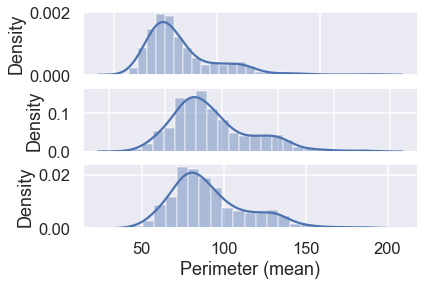

In [15]:
plt.subplot(311)
sns.distplot(dataset["Area (mean)"])
plt.subplot(312)
sns.distplot(dataset["Radius (mean)"])
plt.subplot(313)
sns.distplot(dataset["Perimeter (mean)"])


The chart above calculates a kernel density as well. To get a real histogram, we have to disable the `kde` feature. We can also increase to number of buckets for our histogram by setting `bins` to 50.

<ipython-input-16-2c11a4e4e3fb>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset["Area (mean)"], kde=False, bins=50)
<ipython-input-16-2c11a4e4e3fb>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(dataset["Radius (mean)"], kde=False, bins=50)
<ipython-input-16-2c11a4e4e3fb>:6: UserWarni

<AxesSubplot:xlabel='Perimeter (mean)'>

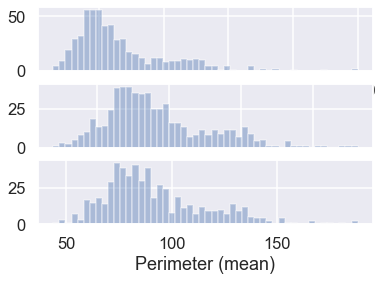

In [16]:
plt.subplot(311)
sns.distplot(dataset["Area (mean)"], kde=False, bins=50)
plt.subplot(312)
sns.distplot(dataset["Radius (mean)"], kde=False, bins=50)
plt.subplot(313)
sns.distplot(dataset["Perimeter (mean)"], kde=False, bins=50)


### Bivariate Plotting

Numbers get even more interesting when we can compare them to other numbers! Lets start comparing the number of years married vs the number of affairs. Seaborn provides us with a method called `jointplot` for this use case.

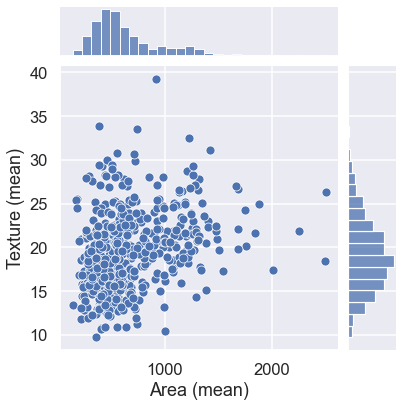

In [17]:
sns.jointplot(data=dataset, x ="Area (mean)", y="Texture (mean)")

To get a better feeling of how the number of affairs is affected by the number of years married, we can use a regression model by specifying `kind` as `reg`.

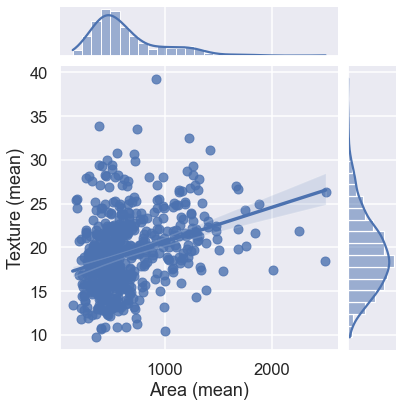

In [18]:
sns.jointplot(data=dataset, x ="Area (mean)", y="Texture (mean)", kind="reg")

We can get an even better comparison by plotting everything vs everything! Seaborn provides this with the `pairplot` method.

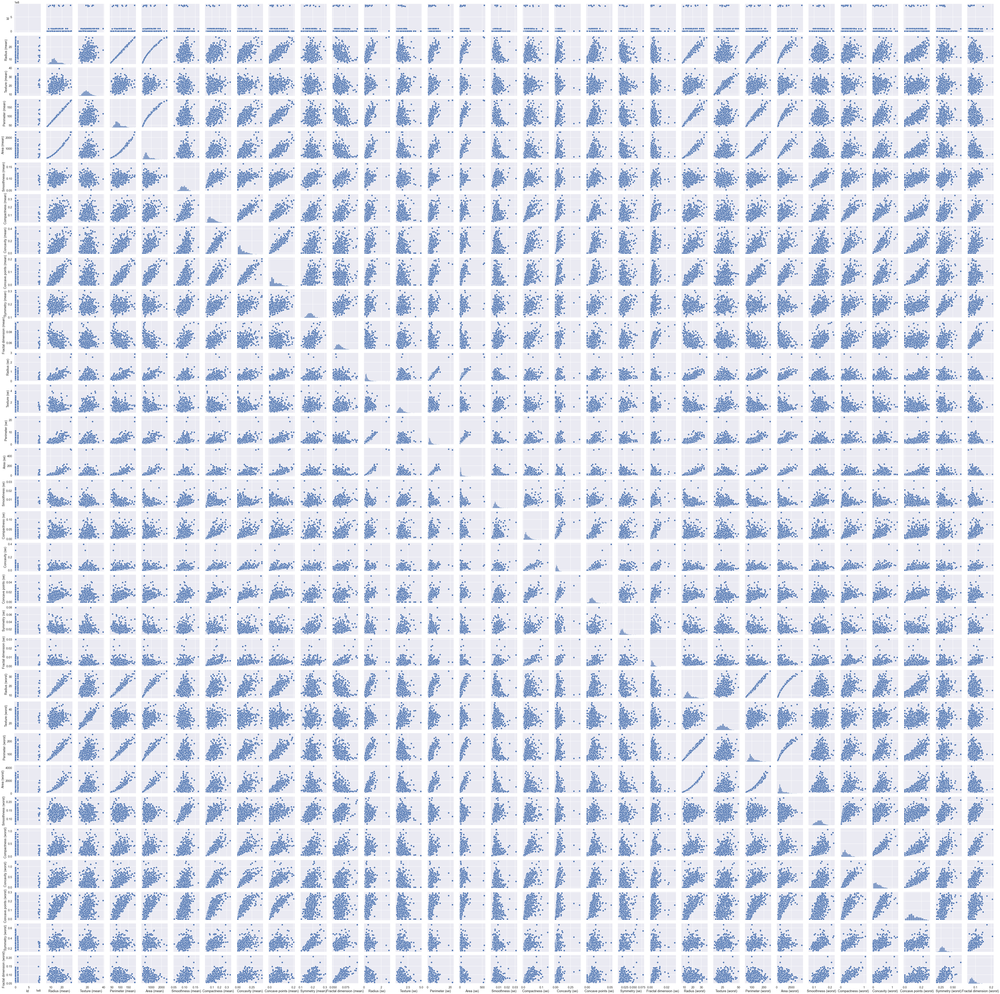

In [19]:
sns.pairplot(dataset,)

You won't see any special in this data. We need to separate them by some kind of criteria. We can use our categorical values to do this! Seaborn uses a parameter called `hue` to do this. Let's separate our data by `sex` first. To make things even more interesting, let's create a regression for every plot, too!

<AxesSubplot:xlabel='Radius (mean)', ylabel='Area (mean)'>

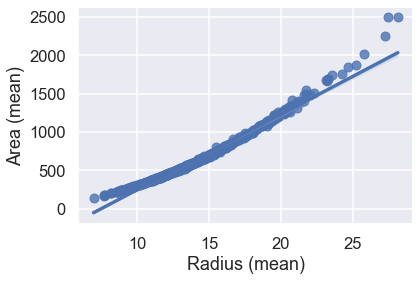

In [20]:
sns.regplot(data=dataset, x='Radius (mean)', y='Area (mean)')

To get even better separation, we can use `lmplot` to compare just the fields we need.

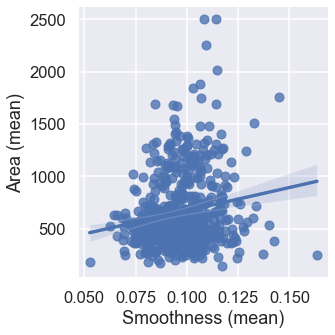

In [21]:
sns.lmplot(data=dataset, x='Smoothness (mean)', y='Area (mean)')

Here are some categorical plots to explore the dataset even further.

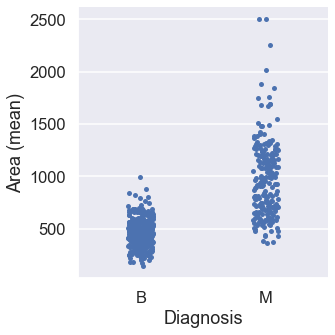

In [25]:
sns.catplot(data=dataset,  y='Area (mean)', x='Diagnosis')

We can also get the correlations between the values by using Pandas builtin method `corr()`.
Feed these stats into Seaborns `heatmap` method will provide us with the visual representation.

<AxesSubplot:>

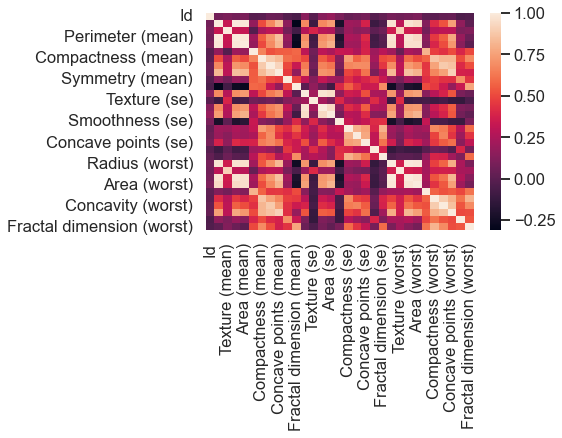

In [26]:
sns.heatmap(dataset.corr())